In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# --- Scikit-learn ---
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn import metrics 

# Import ML Models
from sklearn.linear_model import LinearRegression, Ridge, ElasticNet 
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor 
from sklearn.tree import DecisionTreeRegressor 
from sklearn.neighbors import KNeighborsRegressor 
from sklearn.svm import SVR 
import xgboost as xgb 

import plotly.express as px
import plotly.graph_objects as go

# --- Plotting Configuration ---
import matplotlib
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_context("notebook", font_scale=1.1)
plt.rcParams['figure.figsize'] = (11, 6)
matplotlib.rcParams['font.sans-serif'] = "Times New Roman"
matplotlib.rcParams['font.family'] = "Times New Roman"
%matplotlib inline


In [2]:
# --- Data Loading ---
fpath_merged = '../datasets/processed/base_df.csv'
df_model = pd.read_csv(fpath_merged)
print(f"Successfully loaded {fpath_merged}!")
    
int_cols = ['Year', 'quarter', 'citymarketid_1', 'citymarketid_2', 'nsmiles', 'passengers']
for col in int_cols:
    df_model[col] = pd.to_numeric(df_model[col], errors='coerce').astype('Int64')
    
if 'period' not in df_model.columns and 'Year' in df_model.columns and 'quarter' in df_model.columns:
    df_model['period'] = df_model['Year'].astype(str) + '-Q' + df_model['quarter'].astype(str)
if 'lg_carrier_is_lcc' not in df_model.columns and 'carrier_lg' in df_model.columns:
    lcc_codes = ['WN', 'NK', 'B6', 'F9', 'G4'] # ensure this list is correct
    df_model['lg_carrier_is_lcc'] = df_model['carrier_lg'].isin(lcc_codes).astype(int)

Successfully loaded ../datasets/processed/base_df.csv!


In [3]:
skewed_cols = ['passengers', 'fare']
for col in skewed_cols:
    df_model[f'log_{col}'] = np.log1p(df_model[col].astype(float))
    print(f"Created log-transformed column: 'log_{col}'")

Created log-transformed column: 'log_passengers'
Created log-transformed column: 'log_fare'


In [4]:
# Create Interaction Terms 
# Based on EDA/Hypothesis, e.g., does fare effect depend on LCC presence?
print("\nCreating Interaction Term (fare * lg_carrier_is_lcc)...")
df_model['fare_x_is_lcc'] = df_model['fare'] * df_model['lg_carrier_is_lcc']


Creating Interaction Term (fare * lg_carrier_is_lcc)...


In [5]:
# Target for Prediction Model
TARGET_PREDICTION = 'log_passengers'

# Features for Prediction Model (X_pred) - include treatment and potential confounders/predictors
FEATURES_PREDICTION = [
    'log_fare', # include treatment variable as a predictor
    # 'fare',
    'nsmiles',
    'large_ms',
    'lf_ms',
    'origin_fare_premium',
    'origin_perc_lcc_pax',
    'dest_fare_premium',
    'dest_perc_lcc_pax',
    'Year', # keep as numeric trend 
    'quarter', # keep as numeric 
    'lg_carrier_is_lcc', # binary
    'carrier_lg',
    'is_Q_with_NYD', 
    'is_Q_with_Memorial', 
    'is_Q_with_Jul4_Indep', 
    'is_Q_with_Labor', 
    'is_Q_with_Thx', 
    'is_Q_with_Christmas', 
    'is_Q_with_Any_Holiday',
    'fare_x_is_lcc'
]

features_prediction = [f for f in FEATURES_PREDICTION if f in df_model.columns]

print(f"Target for Prediction: {TARGET_PREDICTION}")
print(f"Features for Prediction: {features_prediction}")

Target for Prediction: log_passengers
Features for Prediction: ['log_fare', 'nsmiles', 'large_ms', 'lf_ms', 'origin_fare_premium', 'origin_perc_lcc_pax', 'dest_fare_premium', 'dest_perc_lcc_pax', 'Year', 'quarter', 'lg_carrier_is_lcc', 'carrier_lg', 'is_Q_with_NYD', 'is_Q_with_Memorial', 'is_Q_with_Jul4_Indep', 'is_Q_with_Labor', 'is_Q_with_Thx', 'is_Q_with_Christmas', 'is_Q_with_Any_Holiday', 'fare_x_is_lcc']


### One-Hot Encoding for `quarter` & `carrier_lg`

In [6]:
# `quarter`
print("\nApplying One-Hot Encoding for 'quarter'...")
quarter_dummy_cols = []
df_model['quarter'] = df_model['quarter'].astype('category')
quarter_dummies = pd.get_dummies(df_model['quarter'], prefix='Q', drop_first=True) # drop_first=True avoids multicollinearity
quarter_dummy_cols = quarter_dummies.columns.tolist()
df_model = pd.concat([df_model, quarter_dummies], axis=1)
df_model.drop('quarter', axis=1, inplace=True)
print(f"Created quarter dummies: {quarter_dummy_cols}")


Applying One-Hot Encoding for 'quarter'...
Created quarter dummies: ['Q_2', 'Q_3', 'Q_4']


In [7]:
# `carrier_lg``
print("\nApplying One-Hot Encoding for 'carrier_lg' (top 3)...")
top_3_carriers = df_model['carrier_lg'].value_counts().nlargest(3).index.tolist()
top_3_dummy_carriers = []
for c in top_3_carriers:
    dummy_col_name = f'carrier_{c}'
    # 1 if carrier_lg matches this top carrier, otherwise 0
    df_model[dummy_col_name] = np.where(df_model['carrier_lg'] == c, 1, 0)
    top_3_dummy_carriers.append(dummy_col_name)
    print(f"Created dummy column {dummy_col_name}!")

df_model.drop('carrier_lg', axis=1, inplace=True) # drop original column


Applying One-Hot Encoding for 'carrier_lg' (top 3)...
Created dummy column carrier_WN!
Created dummy column carrier_DL!
Created dummy column carrier_AA!


In [8]:
# Update feature lists if dummies are added
def update_feature_list(feature_list, old_col, new_cols):
    new_list = [f for f in feature_list if f != old_col] # remove old if exists
    for new_col in new_cols:
        if new_col not in new_list: # add new dummies if not already present
            new_list.append(new_col)
    return new_list

features_prediction = update_feature_list(features_prediction, 'quarter', quarter_dummy_cols)
features_prediction = update_feature_list(features_prediction, 'carrier_lg', top_3_dummy_carriers)

print("\n--- Updated Feature Lists After Dummies ---")
print(f"Features for Prediction: {features_prediction}")


--- Updated Feature Lists After Dummies ---
Features for Prediction: ['log_fare', 'nsmiles', 'large_ms', 'lf_ms', 'origin_fare_premium', 'origin_perc_lcc_pax', 'dest_fare_premium', 'dest_perc_lcc_pax', 'Year', 'lg_carrier_is_lcc', 'is_Q_with_NYD', 'is_Q_with_Memorial', 'is_Q_with_Jul4_Indep', 'is_Q_with_Labor', 'is_Q_with_Thx', 'is_Q_with_Christmas', 'is_Q_with_Any_Holiday', 'fare_x_is_lcc', 'Q_2', 'Q_3', 'Q_4', 'carrier_WN', 'carrier_DL', 'carrier_AA']


In [9]:
# Scaling Numerical Features (Setup - actual scaling happens AFTER train/test split)
# Identify numerical features needing scaling (excluding binary/dummy vars)

numerical_features_to_scale = [
    'log_fare', 'nsmiles', 'large_ms', 'lf_ms', 
    'origin_fare_premium', 'origin_perc_lcc_pax',
    'dest_fare_premium', 'dest_perc_lcc_pax', 'Year', 'fare_x_is_lcc'
]
    
# Filter based on columns present in df_model
numerical_features_to_scale = sorted(list(set([f for f in numerical_features_to_scale if f in df_model.columns])))

print(f"\nNumerical features identified for scaling (will be done after split): {numerical_features_to_scale}")

# 4. Final Check
print("\n--- Final Processed DataFrame for Modeling (df_model) ---")
df_model.info()
print(df_model.head())


Numerical features identified for scaling (will be done after split): ['Year', 'dest_fare_premium', 'dest_perc_lcc_pax', 'fare_x_is_lcc', 'large_ms', 'lf_ms', 'log_fare', 'nsmiles', 'origin_fare_premium', 'origin_perc_lcc_pax']

--- Final Processed DataFrame for Modeling (df_model) ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115032 entries, 0 to 115031
Data columns (total 36 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Year                   115032 non-null  Int64  
 1   citymarketid_1         115032 non-null  Int64  
 2   citymarketid_2         115032 non-null  Int64  
 3   city1                  115032 non-null  object 
 4   city2                  115032 non-null  object 
 5   nsmiles                115032 non-null  Int64  
 6   passengers             115032 non-null  Int64  
 7   fare                   115032 non-null  float64
 8   large_ms               115032 non-null  float64
 9   fare_lg      

In [10]:
# --- Save Processed Data ---
fpath_processed = '../datasets/processed/final_df.csv'
df_model.to_csv(fpath_processed, index=False)
print(f"Processed data saved to {fpath_processed}!")

Processed data saved to ../datasets/processed/final_df.csv!


In [11]:
bool_cols = ['Q_2', 'Q_3', 'Q_4', 
             'is_Q_with_NYD', 'is_Q_with_Memorial', 'is_Q_with_Jul4_Indep', 
             'is_Q_with_Labor', 'is_Q_with_Thx', 'is_Q_with_Christmas',
             'carrier_WN', 'carrier_DL', 'carrier_AA' , 'lg_carrier_is_lcc'] 
for col in bool_cols:
    if col in df_model.columns: 
        df_model[col] = df_model[col].astype(bool)
int_cols = ['passengers', 'Year', 'nsmiles'] 
for col in int_cols:
     if col in df_model.columns: df_model[col] = pd.to_numeric(df_model[col], errors='coerce').astype('Int64')
print("Loaded df_model info:")
df_model.info()

Loaded df_model info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115032 entries, 0 to 115031
Data columns (total 36 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Year                   115032 non-null  Int64  
 1   citymarketid_1         115032 non-null  Int64  
 2   citymarketid_2         115032 non-null  Int64  
 3   city1                  115032 non-null  object 
 4   city2                  115032 non-null  object 
 5   nsmiles                115032 non-null  Int64  
 6   passengers             115032 non-null  Int64  
 7   fare                   115032 non-null  float64
 8   large_ms               115032 non-null  float64
 9   fare_lg                115032 non-null  float64
 10  carrier_low            115032 non-null  object 
 11  lf_ms                  115032 non-null  float64
 12  fare_low               115032 non-null  float64
 13  origin_fare_premium    115032 non-null  float64
 14  origin_perc_lc

### 0. Helper Functions 

In [12]:
def calculate_metrics(df, method, y_true_log, y_pred_log):
    """Calculates log-scale metrics & original-scale MAE, RMSE, and adds them to a DataFrame."""
    mae_log = metrics.mean_absolute_error(y_true_log, y_pred_log)
    mse_log = metrics.mean_squared_error(y_true_log, y_pred_log)    
    rmse_log = np.sqrt(mse_log)
    r2_log = metrics.r2_score(y_true_log, y_pred_log)
    
    y_true_orig = np.expm1(y_true_log)
    y_pred_orig = np.expm1(y_pred_log)
    mae_orig = metrics.mean_absolute_error(y_true_orig, y_pred_orig)
    rmse_orig = np.sqrt(metrics.mean_squared_error(y_true_orig, y_pred_orig))
    df.loc[method] = [mae_orig, mae_log, mse_log, rmse_orig, rmse_log, r2_log]
    

def calculate_cross_validation_scores(df, model, method, X, y_log, cv=5):
    """Calculates cross-validated metrics on log scale"""
    # Use negative scores because cross_val_score maximizes utility (so minimizes neg error)
    mae_cv_log = -cross_val_score(model, X, y_log, scoring='neg_mean_absolute_error', cv=cv).mean()
    mse_cv_log = -cross_val_score(model, X, y_log, scoring='neg_mean_squared_error', cv=cv).mean()
    rmse_cv_log = -cross_val_score(model, X, y_log, scoring='neg_root_mean_squared_error', cv=cv).mean()
    r2_cv_log = cross_val_score(model, X, y_log, scoring='r2', cv=cv).mean()
    df.loc[method] = [mae_cv_log, mse_cv_log, rmse_cv_log, r2_cv_log]
    

def plot_forecast_vs_price(y_pred, price_actual, model_name):
    """Plots predicted values against actual price."""
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=price_actual, y=y_pred, alpha=0.5)
    plt.title(f'{model_name}: Predicted Passengers vs. Fare (on Test Set)')
    plt.xlabel('Fare ($)')
    plt.ylabel('Predicted Passengers')
    plt.grid(True)
    plt.show()

def plot_residuals(y_true_log, y_pred_log, model_name):
    """Calculates and plots residuals vs. predicted values."""
    residuals = np.array(y_true_log) - np.array(y_pred_log)
    y_pred_log_np = np.array(y_pred_log)
    
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred_log_np, y=residuals, alpha=0.5)
    plt.axhline(0, color='red', linestyle='--', lw=2)
    plt.title(f'{model_name}: Residuals vs. Predicted Values (on Test Set)')
    plt.xlabel('Predicted log(Passengers + 1)')
    plt.ylabel('Residuals [Actual - Predicted log(Passengers + 1)]')
    plt.grid(True)
    plt.show()
    
def plot_residual_distribution(y_true_log, y_pred_log, model_name):
    """Plots the distribution of residuals."""
    residuals = np.array(y_true_log) - np.array(y_pred_log)
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, kde=True, bins=50)
    mean_res = np.mean(residuals)
    plt.axvline(mean_res, color='red', linestyle='--', lw=2, label=f'Mean Residual: {mean_res:.3f}')
    plt.title(f'{model_name}: Distribution of Residuals (Log Scale - Test Set)')
    plt.xlabel('Residual [Actual - Predicted log(Passengers + 1)]')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_actual_vs_predicted(y_true, y_pred, model_name):
    """Plots actual vs predicted values."""
    plt.figure(figsize=(8, 8))
    y_true_np = np.array(y_true)
    y_pred_np = np.array(y_pred)
    # Filter out potential Infs from inverse transform if pred were extreme
    valid_indices = np.isfinite(y_true_np) & np.isfinite(y_pred_np)
    if not np.any(valid_indices):
        min_val, max_val = 0, 1
    else:
        y_true_np = y_true_np[valid_indices]
        y_pred_np = y_pred_np[valid_indices]
        min_val = min(y_true_np.min(), y_pred_np.min()) * 0.95 
        max_val = max(y_true_np.max(), y_pred_np.max()) * 1.05
        
    plt.scatter(y_true_np, y_pred_np, alpha=0.5)
    plt.plot([min_val, max_val], [min_val, max_val], '--', color='red', lw=2)
    plt.title(f'{model_name}: Actual vs. Predicted Passengers (Original Scale - Test Set)')
    plt.xlabel('Actual Passengers')
    plt.ylabel('Predicted Passengers')
    plt.xlim(min_val, max_val)
    plt.ylim(min_val, max_val)
    plt.grid(True)
    plt.show()
    
def plot_actual_vs_predicted_plotly(y_true, y_pred, model_name):
    """Creates an interactive scatter plot of actual vs predicted values."""
    df_plot = pd.DataFrame({'Actual': y_true, 'Predicted': y_pred}).dropna()
    fig = px.scatter(df_plot, x='Actual', y='Predicted',
                     opacity=0.6, hover_data={'Actual':':.0f', 'Predicted':':.0f'}) 

    # Add y=x line
    min_val = min(df_plot['Actual'].min(), df_plot['Predicted'].min()) * 0.95
    max_val = max(df_plot['Actual'].max(), df_plot['Predicted'].max()) * 1.05
    fig.add_shape(type='line', x0=min_val, y0=min_val, x1=max_val, y1=max_val,
                  line=dict(color='red', dash='dash'))

    fig.update_layout(
        title=f'{model_name}: Actual vs. Predicted Passengers (Original Scale - Test Set)',
        xaxis_title='Actual Passengers',
        yaxis_title='Predicted Passengers',
        xaxis_range=[min_val, max_val],
        yaxis_range=[min_val, max_val],
        width=700, height=700 # adjust size
    )
    fig.show()

def plot_metric_comparison(results_df, metric='RMSE', ascending=True, title='Model Performance Comparison'):
    """Plots a bar chart comparing a specified metric across models."""
    # Ensure the metric column exists
    if metric not in results_df.columns:
        print(f"Metric '{metric}' not found in results DataFrame.")
        # Try finding a default metric like RMSE or MAE if the requested one is missing
        fallback_metrics = ['RMSE', 'MAE_log', 'R2_log', 'RMSE_log']
        for fm in fallback_metrics:
            if fm in results_df.columns:
                print(f"Defaulting to plot '{fm}'.")
                metric = fm
                ascending = False if 'R2' in metric else True 
                break
        else: 
            print("No standard metrics found to plot.")
            return

    # Sort by the chosen metric
    results_df_sorted = results_df.sort_values(by=metric, ascending=ascending)

    plt.figure(figsize=(10, max(5, len(results_df_sorted) * 0.5))) 
    ax = sns.barplot(x=results_df_sorted[metric], y=results_df_sorted.index, palette='viridis', orient='h')
    plt.xlabel(metric)
    plt.ylabel('Model')
    plt.title(title)
    # Add value labels to the bars
    fmt = '%.3f' if 'R2' in metric else '%.2f'
    ax.bar_label(ax.containers[0], fmt=fmt, padding=3)
    plt.tight_layout()
    plt.show()

### 1. Data Split

In [13]:
X = df_model[features_prediction]
y = df_model[TARGET_PREDICTION].astype(float) # ensure target is float
# y_test: log_passengers
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.25, random_state=42
)
print(f"Training set size: {X_train.shape[0]}, Test set size: {X_test.shape[0]}")

Training set size: 86274, Test set size: 28758


### 2. Preprocessing (Scaling)

In [14]:
# Create preprocessor to scale numerical features, pass through dummies/binary
# Dummies ('Q_2', 'Q_3', 'Q_4') and binary ('lg_carrier_is_lcc') are excluded from scaling.
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features_to_scale)
    ],
    remainder='passthrough' # keep other columns (dummies, binary)
)
print("Preprocessor setup complete.")


Preprocessor setup complete.


### 3. Define & Train Models using Pipelines

In [15]:
methods = ['Linear Regression', 'Ridge Regression', 'ElasticNet Regression', 'Random Forest', 'XGBoost', 'KNN Regression']

In [16]:
error_df = pd.DataFrame(columns=['MAE', 'MAE_log', 'MSE_log', 'RMSE', 'RMSE_log', 'R2_log'], index=methods)
display(error_df)
cv_df = pd.DataFrame(columns=['MAE_log', 'MSE_log', 'RMSE_log', 'R2_log'], index=methods)
display(cv_df)
trained_pipelines = {}

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,NaN,NaN,NaN,NaN,NaN,NaN
Ridge Regression,NaN,NaN,NaN,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN,NaN,NaN


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,NaN,NaN,NaN,NaN
Ridge Regression,NaN,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


#### 3.1. Linear Regression

In [17]:
method = 'Linear Regression'

print(f"\n--- Processing Model: {method} ---")
pipeline_lr = Pipeline(steps=[('preprocessor', preprocessor),
                              ('regressor', LinearRegression())])

print(f"Training {method}...")
pipeline_lr.fit(X_train, y_train)
trained_pipelines[method] = pipeline_lr

print(f"Predicting with {method}...")
y_pred_log_lr = pipeline_lr.predict(X_test)
display(pd.DataFrame(y_pred_log_lr))


--- Processing Model: Linear Regression ---
Training Linear Regression...
Predicting with Linear Regression...


,0
0,5.846191
1,6.400635
2,6.452026
3,6.399780
4,6.499878
...,...
28753,6.276978
28754,6.612549
28755,6.604370
28756,5.975952


In [18]:
calculate_metrics(error_df, method, y_test, y_pred_log_lr)
calculate_cross_validation_scores(cv_df, pipeline_lr, method, X, y, cv=5)
display(error_df)
display(cv_df)

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,NaN,NaN,NaN,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN,NaN,NaN


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,0.824574,4.121537,1.562348,-3.983277
Ridge Regression,NaN,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


Generating plots for Linear Regression...


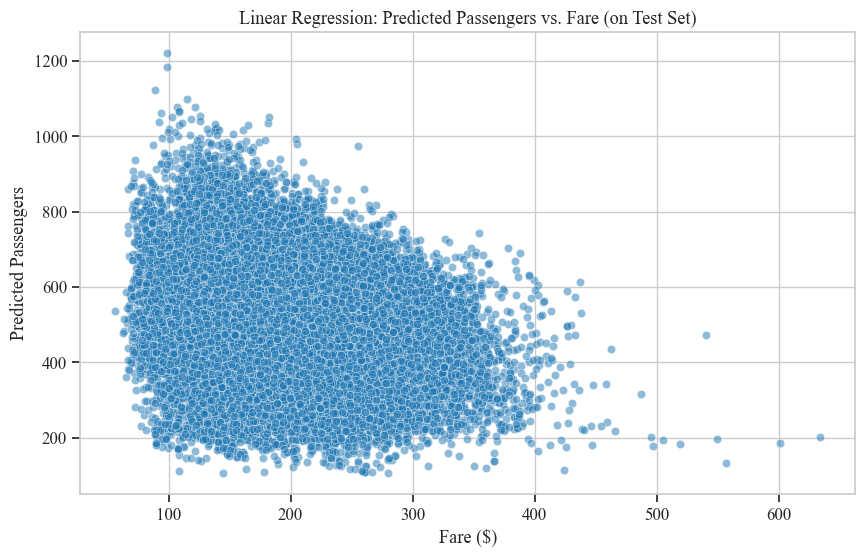

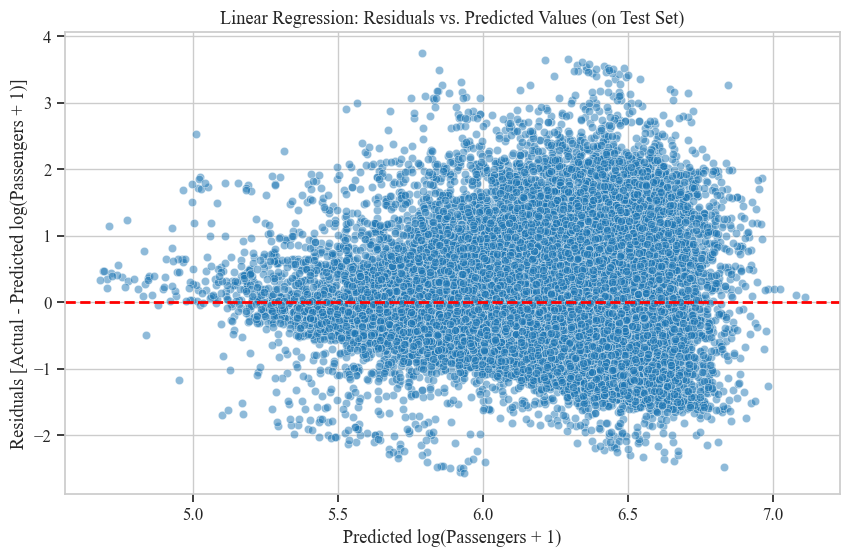

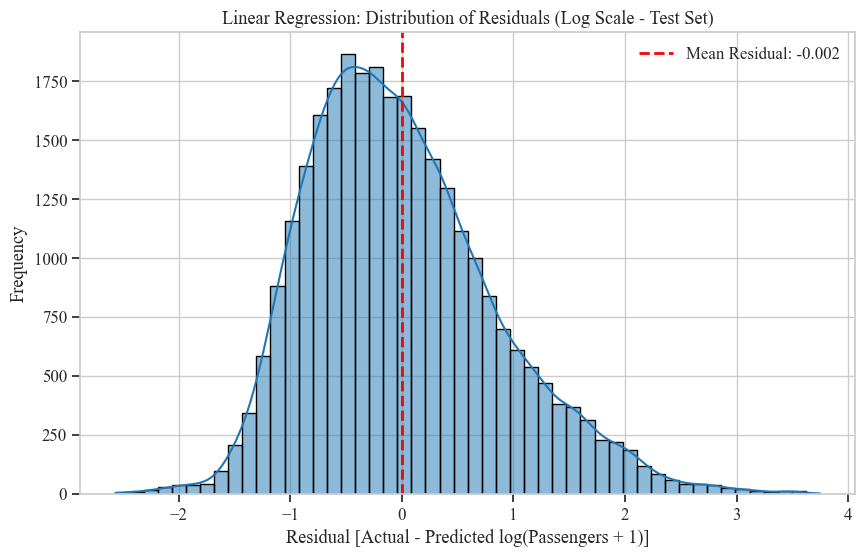

In [19]:
print(f"Generating plots for {method}...")
y_pred_lr = np.expm1(y_pred_log_lr)
y_test_o = np.expm1(y_test) 
plot_forecast_vs_price(y_pred_lr, df_model.loc[X_test.index, 'fare'], method)
plot_residuals(y_test, y_pred_log_lr, method)
plot_residual_distribution(y_test, y_pred_log_lr, method)
# plot_actual_vs_predicted(y_test, y_pred_lr, method)
plot_actual_vs_predicted_plotly(y_test_o, y_pred_lr, method)

#### 3.2. Ridge Regression

In [20]:
method = "Ridge Regression"
print(f"\n--- Processing Model: {method} ---")
pipeline_ridge = Pipeline(steps=[('preprocessor', preprocessor),
                                 ('regressor', Ridge(alpha=1.0))]) # adjust alpha if needed
print(f"Training {method}...")
pipeline_ridge.fit(X_train, y_train)
trained_pipelines[method] = pipeline_ridge

print(f"Predicting with {method}...")
y_pred_log_ridge = pipeline_ridge.predict(X_test)
display(pd.DataFrame(y_pred_log_ridge))


--- Processing Model: Ridge Regression ---
Training Ridge Regression...
Predicting with Ridge Regression...


,0
0,5.837211
1,6.392373
2,6.443229
3,6.403975
4,6.496874
...,...
28753,6.281466
28754,6.603888
28755,6.608370
28756,5.981732


In [21]:
calculate_metrics(error_df, method, y_test, y_pred_log_ridge)
display(error_df)
calculate_cross_validation_scores(cv_df, pipeline_ridge, method, X, y, cv=5)
display(cv_df)

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,542.986772,0.673726,0.726695,1302.81102,0.852464,0.119381
ElasticNet Regression,NaN,NaN,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN,NaN,NaN


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,0.824574,4.121537,1.562348,-3.983277
Ridge Regression,0.82421,4.09581,1.559447,-3.952184
ElasticNet Regression,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


Generating plots for Ridge Regression...


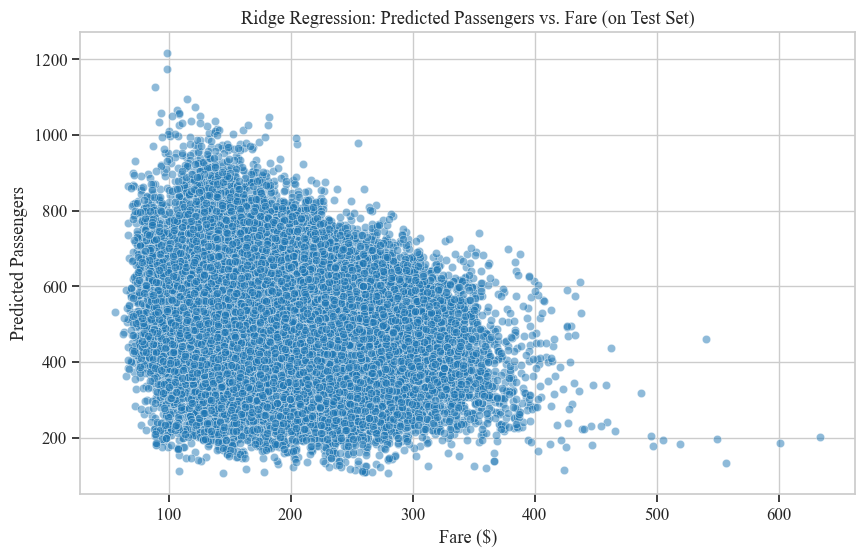

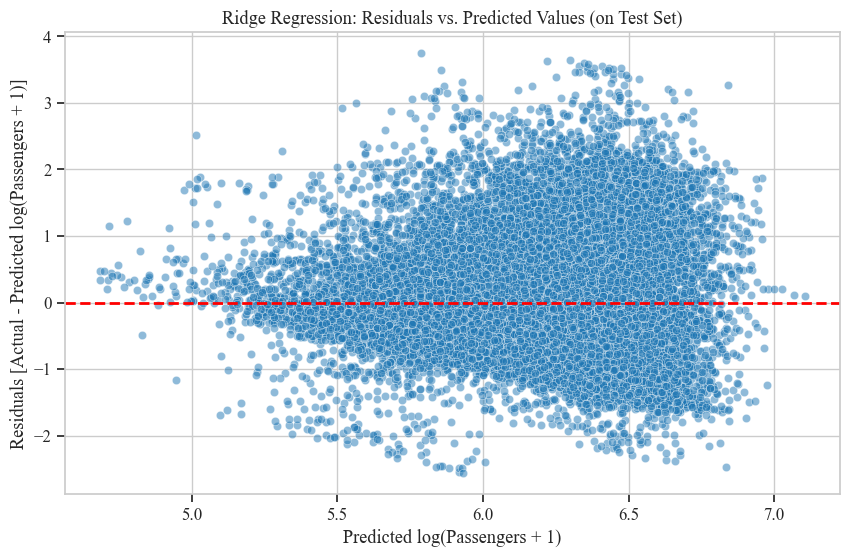

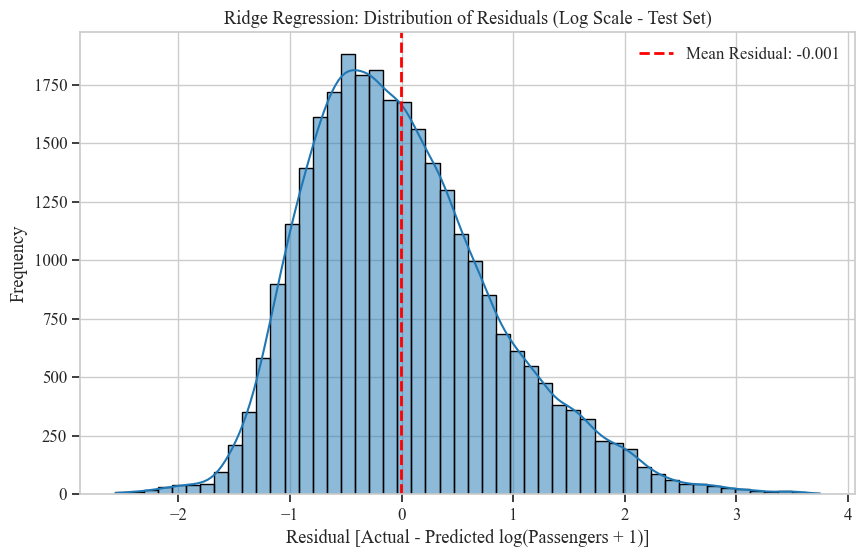

In [22]:
print(f"Generating plots for {method}...")
y_pred_ridge = np.expm1(y_pred_log_ridge)
# y_test_o = np.expm1(y_test) 
plot_forecast_vs_price(y_pred_ridge, df_model.loc[X_test.index, 'fare'], method)
plot_residuals(y_test, y_pred_log_ridge, method)
plot_residual_distribution(y_test, y_pred_log_ridge, method)
plot_actual_vs_predicted_plotly(y_test_o, y_pred_ridge, method)

#### 3.3. ElasticNet Regression

In [23]:
method = "ElasticNet Regression"
print(f"\n--- Processing Model: {method} ---")
pipeline_enet = Pipeline(steps=[('preprocessor', preprocessor),
                                 ('regressor', ElasticNet(alpha=1.0))]) # adjust alpha if needed
print(f"Training {method}...")
pipeline_enet.fit(X_train, y_train)
trained_pipelines[method] = pipeline_enet

print(f"Predicting with {method}...")
y_pred_log_enet = pipeline_enet.predict(X_test)
display(pd.DataFrame(y_pred_log_enet))


--- Processing Model: ElasticNet Regression ---
Training ElasticNet Regression...
Predicting with ElasticNet Regression...


,0
0,6.186148
1,6.186148
2,6.186148
3,6.186148
4,6.186148
...,...
28753,6.186148
28754,6.186148
28755,6.186148
28756,6.186148


In [24]:
calculate_metrics(error_df, method, y_test, y_pred_log_enet)
display(error_df)
calculate_cross_validation_scores(cv_df, pipeline_enet, method, X, y, cv=5)
display(cv_df)

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,542.986772,0.673726,0.726695,1302.81102,0.852464,0.119381
ElasticNet Regression,565.630245,0.726473,0.82521,1335.463839,0.908411,-0.0
Random Forest,NaN,NaN,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN,NaN,NaN


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,0.824574,4.121537,1.562348,-3.983277
Ridge Regression,0.82421,4.09581,1.559447,-3.952184
ElasticNet Regression,0.733032,0.84109,0.915739,-0.013423
Random Forest,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


Generating plots for ElasticNet Regression...


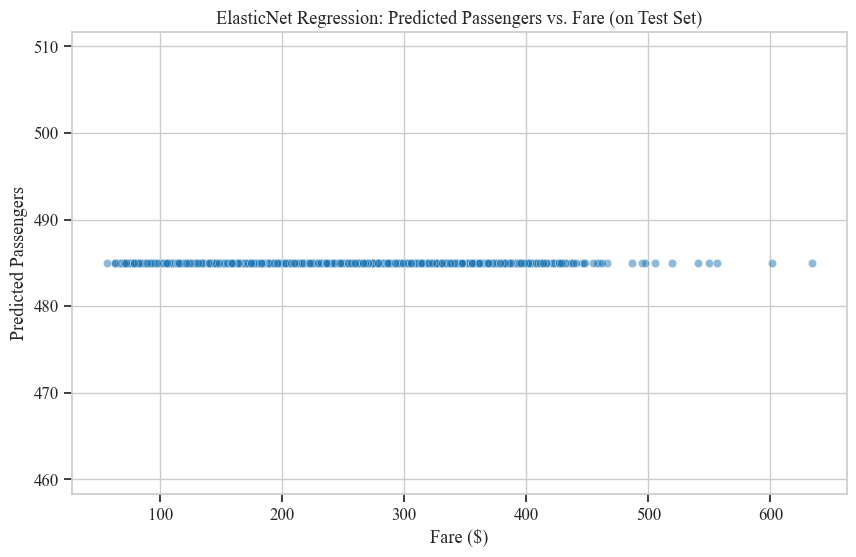

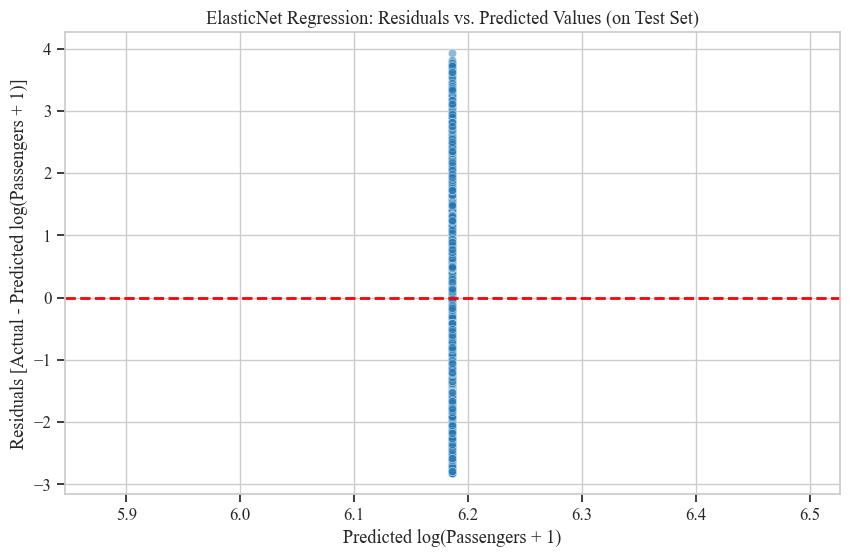

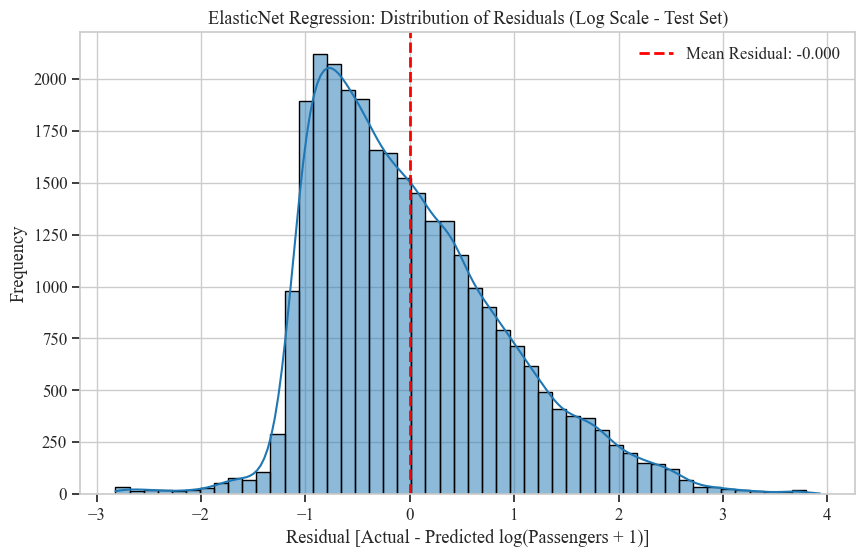

In [25]:
print(f"Generating plots for {method}...")
y_pred_enet = np.expm1(y_pred_log_enet)
# y_test_o = np.expm1(y_test) 
plot_forecast_vs_price(y_pred_enet, df_model.loc[X_test.index, 'fare'], method)
plot_residuals(y_test, y_pred_log_enet, method)
plot_residual_distribution(y_test, y_pred_log_enet, method)
plot_actual_vs_predicted_plotly(y_test_o, y_pred_enet, method)

#### 3.4. Random Forest

In [26]:
method = "Random Forest"
print(f"\n--- Processing Model: {method} ---")
pipeline_rf = Pipeline(steps=[('preprocessor', preprocessor),
                              ('regressor', RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1,
                                                                max_depth=15, min_samples_leaf=10))])
print(f"Training {method}...")
pipeline_rf.fit(X_train, y_train)
trained_pipelines[method] = pipeline_rf
print(f"Predicting with {method}...")
y_pred_log_rf = pipeline_rf.predict(X_test)
display(pd.DataFrame(y_pred_log_rf))


--- Processing Model: Random Forest ---
Training Random Forest...
Predicting with Random Forest...


,0
0,5.457476
1,5.768511
2,6.078315
3,6.084662
4,6.224005
...,...
28753,5.978975
28754,6.551643
28755,6.766314
28756,5.783886


In [27]:
calculate_metrics(error_df, method, y_test, y_pred_log_rf)
display(error_df)
calculate_cross_validation_scores(cv_df, pipeline_rf, method, X, y, cv=5)
display(cv_df)

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,542.986772,0.673726,0.726695,1302.81102,0.852464,0.119381
ElasticNet Regression,565.630245,0.726473,0.82521,1335.463839,0.908411,-0.0
Random Forest,362.363485,0.430255,0.32323,866.466381,0.568533,0.608306
XGBoost,NaN,NaN,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN,NaN,NaN


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,0.824574,4.121537,1.562348,-3.983277
Ridge Regression,0.82421,4.09581,1.559447,-3.952184
ElasticNet Regression,0.733032,0.84109,0.915739,-0.013423
Random Forest,0.543949,0.525768,0.720987,0.368512
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


Generating plots for Random Forest...


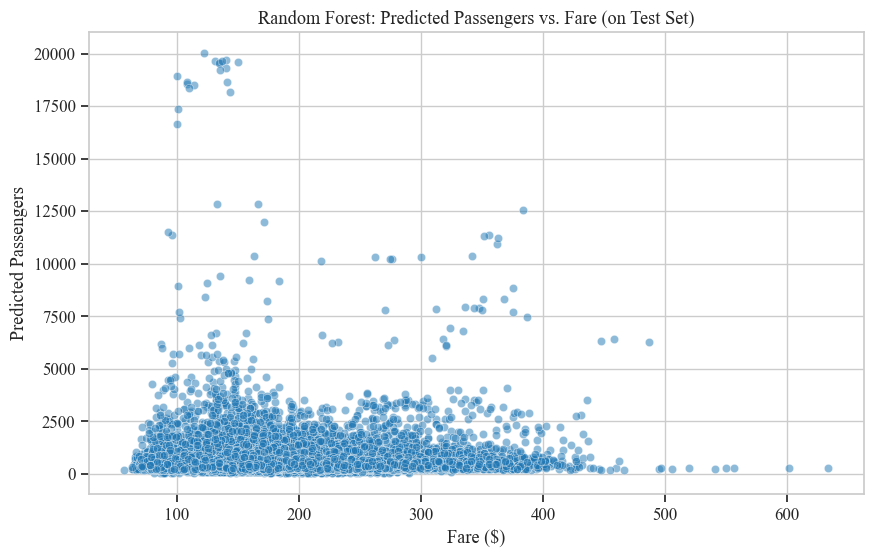

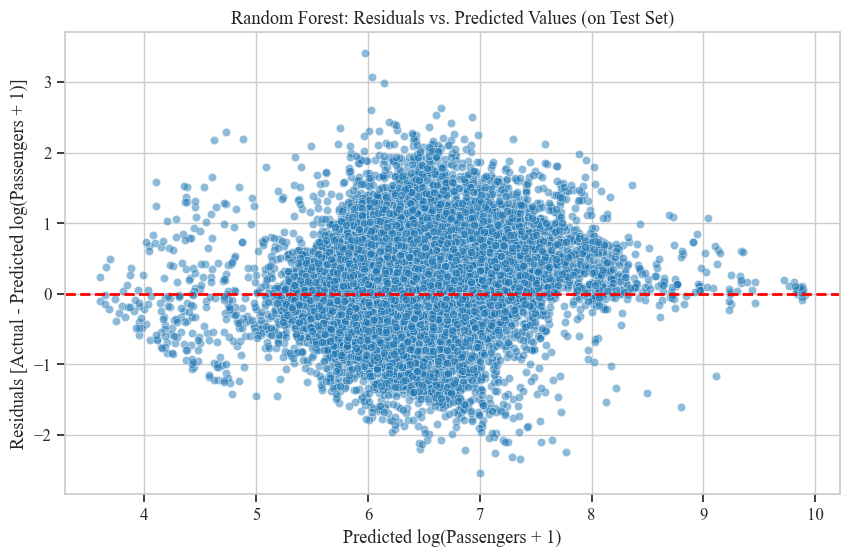

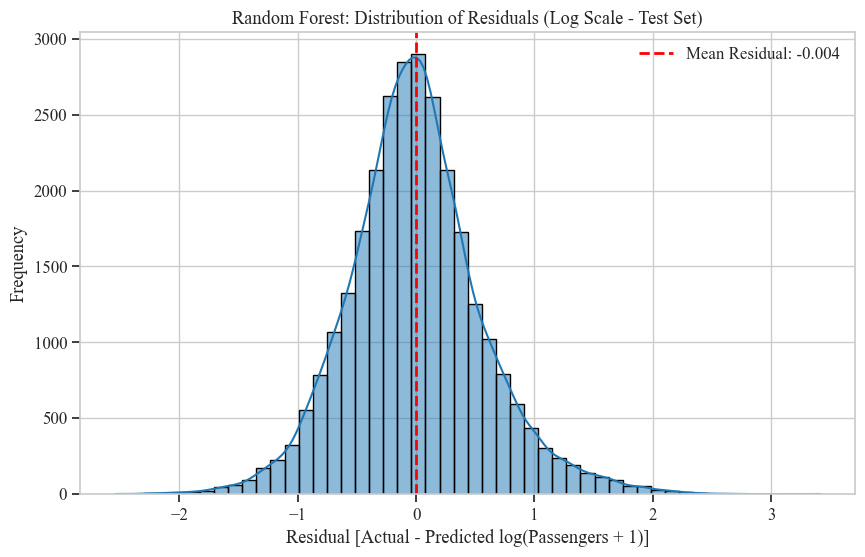

In [28]:
print(f"Generating plots for {method}...")
y_pred_rf = np.expm1(y_pred_log_rf)
# y_test_o = np.expm1(y_test) 
plot_forecast_vs_price(y_pred_rf, df_model.loc[X_test.index, 'fare'], method)
plot_residuals(y_test, y_pred_log_rf, method)
plot_residual_distribution(y_test, y_pred_log_rf, method)
# plot_actual_vs_predicted(y_test, y_pred_rf, method)
plot_actual_vs_predicted_plotly(y_test_o, y_pred_rf, method)

#### 3.6. XGBoost

In [29]:
method = "XGBoost"
print(f"\n--- Processing Model: {method} ---")
xgb_model = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    learning_rate=0.1,
    max_depth=7,
    random_state=42,
    n_jobs=-1
)
pipeline_xgb = Pipeline(steps=[('preprocessor', preprocessor),
                               ('regressor', xgb_model)])
print(f"Training {methods}...")
pipeline_xgb.fit(X_train, y_train)
trained_pipelines[method] = pipeline_xgb
print(f"Predicting with {method}...")
y_pred_log_xgb = pipeline_xgb.predict(X_test)
display(pd.DataFrame(y_pred_log_xgb))


--- Processing Model: XGBoost ---
Training ['Linear Regression', 'Ridge Regression', 'ElasticNet Regression', 'Random Forest', 'XGBoost', 'KNN Regression']...
Predicting with XGBoost...


,0
0,5.578677
1,6.038944
2,6.151908
3,6.315092
4,5.928527
...,...
28753,5.815709
28754,6.579947
28755,6.955959
28756,5.513796


In [30]:
calculate_metrics(error_df, method, y_test, y_pred_log_xgb)
display(error_df)
calculate_cross_validation_scores(cv_df, pipeline_xgb, method, X, y, cv=5)
display(cv_df)

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,542.986772,0.673726,0.726695,1302.81102,0.852464,0.119381
ElasticNet Regression,565.630245,0.726473,0.82521,1335.463839,0.908411,-0.0
Random Forest,362.363485,0.430255,0.32323,866.466381,0.568533,0.608306
XGBoost,386.838168,0.44785,0.328006,976.776412,0.572718,0.602517
KNN Regression,NaN,NaN,NaN,NaN,NaN,NaN


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,0.824574,4.121537,1.562348,-3.983277
Ridge Regression,0.82421,4.09581,1.559447,-3.952184
ElasticNet Regression,0.733032,0.84109,0.915739,-0.013423
Random Forest,0.543949,0.525768,0.720987,0.368512
XGBoost,0.536923,0.495213,0.699802,0.404937
KNN Regression,NaN,NaN,NaN,NaN


Generating plots for XGBoost...


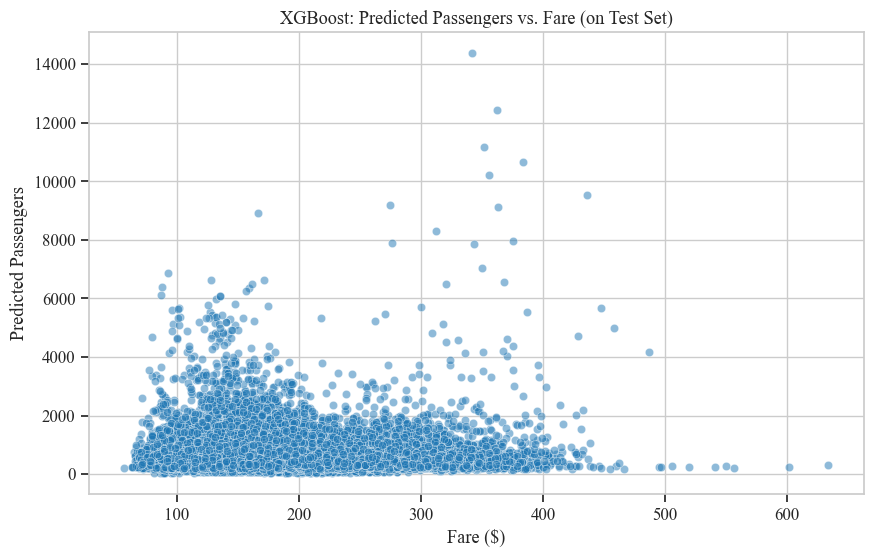

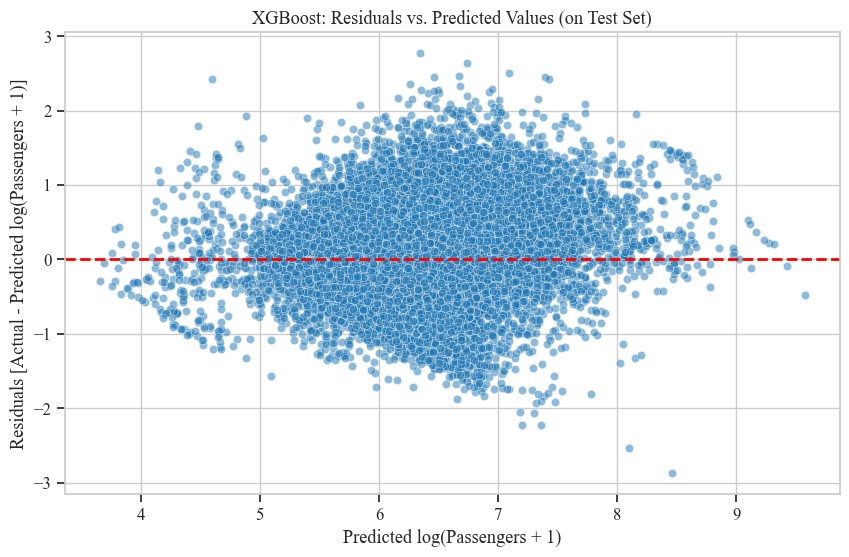

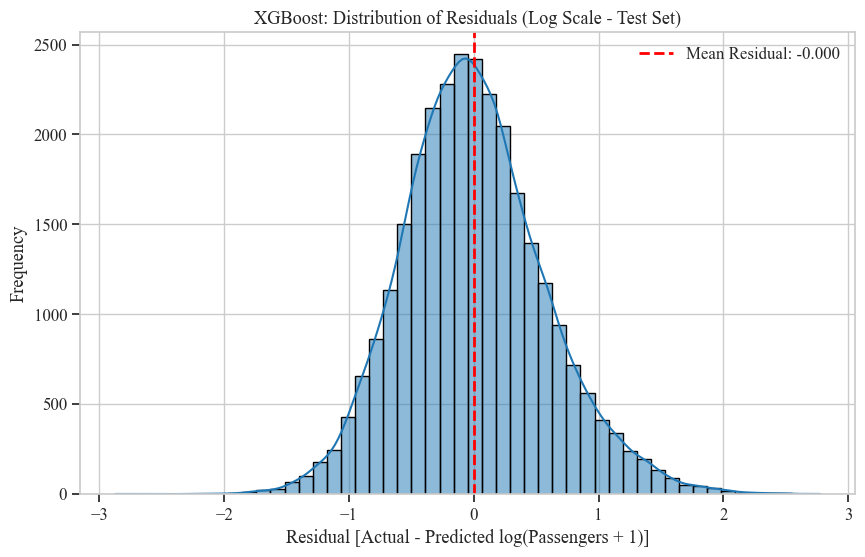

In [31]:
print(f"Generating plots for {method}...")
y_pred_xgb = np.expm1(y_pred_log_xgb)
plot_forecast_vs_price(y_pred_xgb, df_model.loc[X_test.index, 'fare'], method)
plot_residuals(y_test, y_pred_log_xgb, method)
plot_residual_distribution(y_test, y_pred_log_xgb, method)
# plot_actual_vs_predicted(y_test_o, y_pred_xgb, method)
plot_actual_vs_predicted_plotly(y_test_o, y_pred_xgb, method)

#### 3.7. KNN Regression

In [32]:
method = "KNN Regression"
print(f"\n--- Processing Model: {method} ---")
pipeline_knn = Pipeline(steps=[('preprocessor', preprocessor),
                               ('regressor', KNeighborsRegressor(n_neighbors=10))]) # adjust n_neighbors
print(f"Training {method}...")
pipeline_knn.fit(X_train, y_train) 
trained_pipelines[method] = pipeline_knn
print(f"Predicting with {method}...")
y_pred_log_knn = pipeline_knn.predict(X_test)
display(pd.DataFrame(y_pred_log_knn))


--- Processing Model: KNN Regression ---
Training KNN Regression...
Predicting with KNN Regression...


,0
0,6.029264
1,6.093032
2,5.447950
3,6.344502
4,6.744621
...,...
28753,6.905301
28754,6.873822
28755,6.318830
28756,5.649033


In [33]:
calculate_metrics(error_df, method, y_test, y_pred_log_knn)
display(error_df)
calculate_cross_validation_scores(cv_df, pipeline_knn, method, X, y, cv=5)
display(cv_df)

,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,542.986772,0.673726,0.726695,1302.81102,0.852464,0.119381
ElasticNet Regression,565.630245,0.726473,0.82521,1335.463839,0.908411,-0.0
Random Forest,362.363485,0.430255,0.32323,866.466381,0.568533,0.608306
XGBoost,386.838168,0.44785,0.328006,976.776412,0.572718,0.602517
KNN Regression,456.900965,0.529469,0.478588,1125.609818,0.691801,0.420041


,MAE_log,MSE_log,RMSE_log,R2_log
Linear Regression,0.824574,4.121537,1.562348,-3.983277
Ridge Regression,0.82421,4.09581,1.559447,-3.952184
ElasticNet Regression,0.733032,0.84109,0.915739,-0.013423
Random Forest,0.543949,0.525768,0.720987,0.368512
XGBoost,0.536923,0.495213,0.699802,0.404937
KNN Regression,0.596732,0.615042,0.781414,0.259779


Generating plots for KNN Regression...


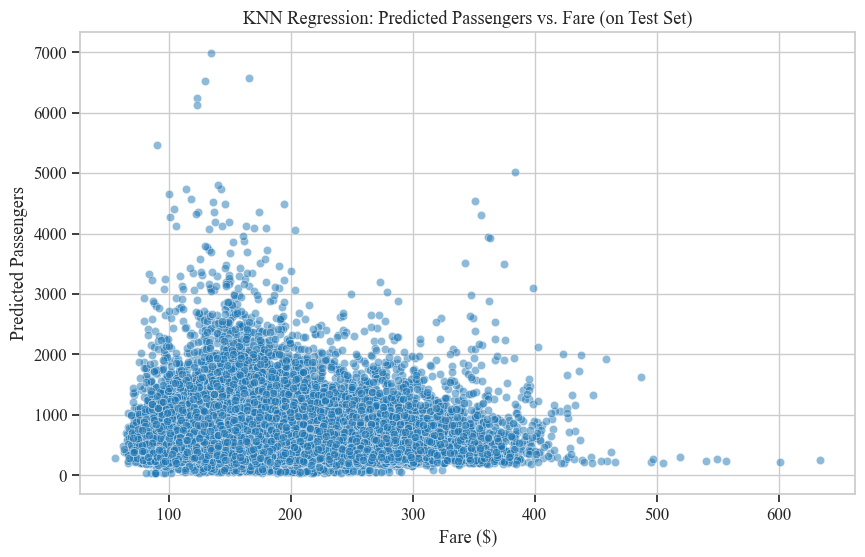

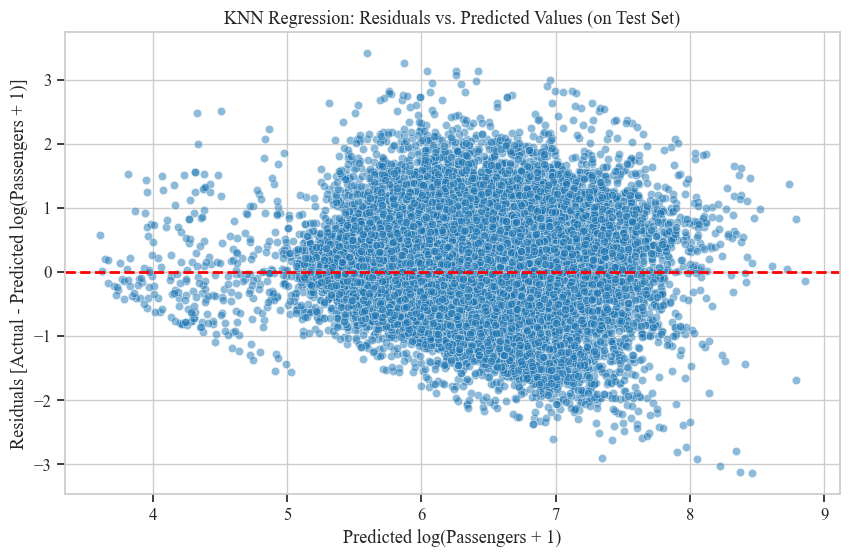

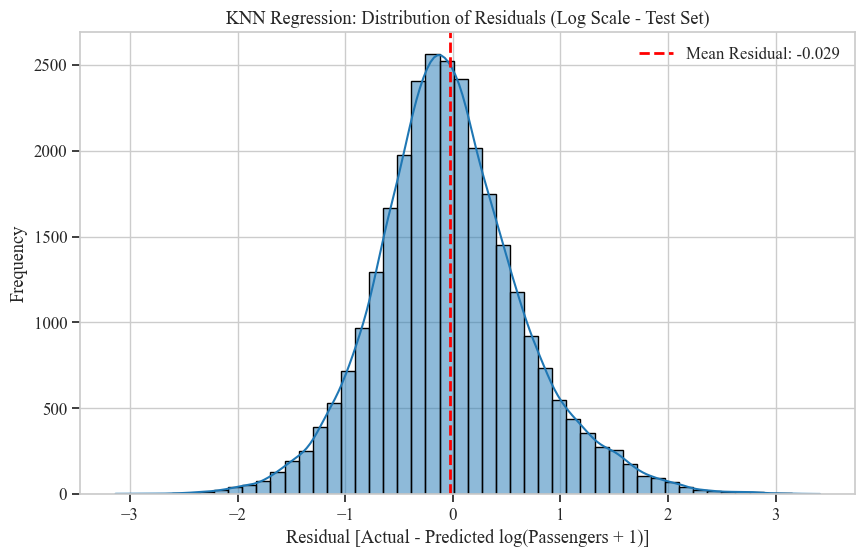

In [34]:
print(f"Generating plots for {method}...")
y_pred_knn = np.expm1(y_pred_log_knn)
plot_forecast_vs_price(y_pred_knn, df_model.loc[X_test.index, 'fare'], method)
plot_residuals(y_test, y_pred_log_knn, method)
plot_residual_distribution(y_test, y_pred_log_knn, method)
# plot_actual_vs_predicted(y_test_o, y_pred_knn, method)
plot_actual_vs_predicted_plotly(y_test_o, y_pred_knn, method)

### 4. Prediction Model Evaluation

In [35]:
min_cv_metric = 'RMSE_log'
best_model = cv_df[min_cv_metric].idxmin()
best_model_score = cv_df.loc[best_model, min_cv_metric]
print(f"Identifying best model based on minimizing CV '{min_cv_metric}':")
print(f"\nBest Model: '{best_model}'")

print("\nFull Cross-Validation Results (Sorted by RMSE_log):")
display(cv_df.sort_values(by=min_cv_metric))

best_model_test_rmse_orig = error_df['RMSE'].idxmin()
print(f"\nBest model based on Test Set 'RMSE' was '{best_model_test_rmse_orig}' (RMSE: {error_df.loc[best_model_test_rmse_orig, 'RMSE']:.2f})")

print("\nTest Set Performance (Sorted by RMSE):")
display(error_df.sort_values(by='RMSE'))

Identifying best model based on minimizing CV 'RMSE_log':

Best Model: 'XGBoost'

Full Cross-Validation Results (Sorted by RMSE_log):


,MAE_log,MSE_log,RMSE_log,R2_log
XGBoost,0.536923,0.495213,0.699802,0.404937
Random Forest,0.543949,0.525768,0.720987,0.368512
KNN Regression,0.596732,0.615042,0.781414,0.259779
ElasticNet Regression,0.733032,0.84109,0.915739,-0.013423
Ridge Regression,0.82421,4.09581,1.559447,-3.952184
Linear Regression,0.824574,4.121537,1.562348,-3.983277



Best model based on Test Set 'RMSE' was 'Random Forest' (RMSE: 866.47)

Test Set Performance (Sorted by RMSE):


,MAE,MAE_log,MSE_log,RMSE,RMSE_log,R2_log
Random Forest,362.363485,0.430255,0.32323,866.466381,0.568533,0.608306
XGBoost,386.838168,0.44785,0.328006,976.776412,0.572718,0.602517
KNN Regression,456.900965,0.529469,0.478588,1125.609818,0.691801,0.420041
Linear Regression,543.008722,0.673781,0.726749,1302.742894,0.852496,0.119316
Ridge Regression,542.986772,0.673726,0.726695,1302.81102,0.852464,0.119381
ElasticNet Regression,565.630245,0.726473,0.82521,1335.463839,0.908411,-0.0


### 5. Feature Importance

In [46]:
def plot_feature_importance(pipeline, input_feature_names, top_n=20):
    """
    Extracts and plots feature importance or coefficients from a scikit-learn pipeline.
    Prioritizes using get_feature_names_out from the preprocessor step.
    """
    # --- Get Model and Preprocessor ---
    preprocessor = pipeline.named_steps.get('preprocessor')
    regressor = pipeline.named_steps.get('regressor')
    if preprocessor is None or regressor is None:
        print("Error: Pipeline steps 'preprocessor' or 'regressor' not found.")
        return
    model_display_name = type(regressor).__name__
    

    print(f"\n--- Feature Importance/Coefficients for {model_display_name} ---")

    # --- Get Feature Names after Preprocessing ---
    feature_names_out = None

    # Use get_feature_names_out on the preprocessor
    feature_names_out = preprocessor.get_feature_names_out(input_feature_names)
    print(f"Successfully extracted {len(feature_names_out)} feature names using get_feature_names_out.")


    # --- Plot based on available attribute ---
    plotted = False
    if hasattr(regressor, 'feature_importances_'):
        importances = regressor.feature_importances_
        if len(feature_names_out) == len(importances):
            importance_df = pd.DataFrame({'feature': feature_names_out, 'importance': importances})
            importance_df = importance_df.sort_values('importance', ascending=False).head(top_n)
            plt.figure(figsize=(10, max(5, len(importance_df) * 0.4))) 
            sns.barplot(data=importance_df, x='importance', y='feature', 
                        legend=False, hue='feature', palette='mako')
            plt.title(f'Top {top_n} Feature Importances ({model_display_name})')
            plt.xlabel('Importance Score'); plt.ylabel('Feature')
            plt.tight_layout()
            plt.savefig(f'../outputs/R_TML_feature_importance_{model_display_name}.png', dpi=300)
            plt.show()
            plotted = True
        else: print(f"Error: Mismatch between feature names ({len(feature_names_out)}) and importances ({len(importances)}).")

    elif hasattr(regressor, 'coef_'):
        coefficients = regressor.coef_
        if coefficients.ndim > 1: coefficients = coefficients.flatten()
        if len(feature_names_out) == len(coefficients):
            coef_df = pd.DataFrame({'feature': feature_names_out, 'coefficient': coefficients})
            coef_df['abs_coefficient'] = np.abs(coef_df['coefficient'])
            coef_df = coef_df.sort_values('abs_coefficient', ascending=False).head(top_n)
            plt.figure(figsize=(10, max(5, len(coef_df) * 0.4))) 
            
            # Plot actual coefficients to see direction
            sns.barplot(data=coef_df.sort_values('coefficient', ascending=False), 
                        x='coefficient', y='feature', color='skyblue')
            plt.title(f'Top {top_n} Feature Coefficients by Absolute Value ({model_display_name})')
            plt.xlabel('Coefficient Value (Impact on log_passengers)')
            plt.axvline(0, color='grey', linestyle='--', linewidth=0.8)
            plt.ylabel('Feature')
            plt.tight_layout()
            plt.savefig(f'../outputs/R_TML_feature_coefficients_{model_display_name}.png', dpi=300)
            plt.show()
            plotted = True
        else: print(f"Error: Mismatch between feature names ({len(feature_names_out)}) and coefficients ({len(coefficients)}).")


Generating feature importances for model: 'XGBoost'

--- Feature Importance/Coefficients for XGBRegressor ---
Successfully extracted 24 feature names using get_feature_names_out.


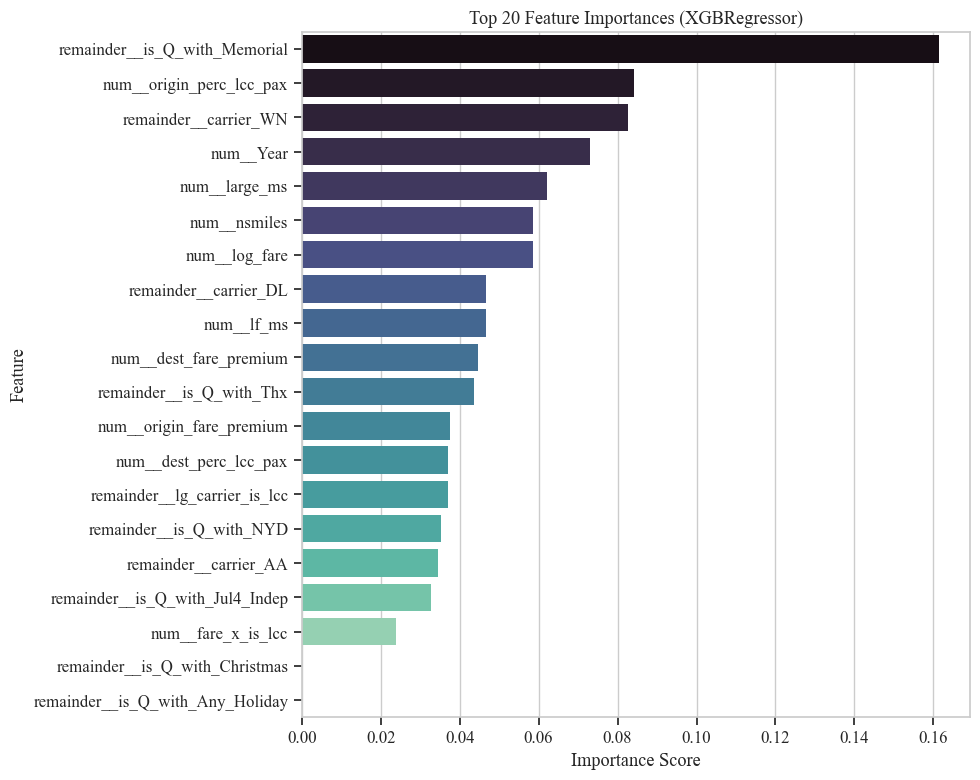

In [47]:
print(f"Generating feature importances for model: '{best_model}'")
best_model_pipeline = trained_pipelines[best_model]
input_features = X_train.columns.tolist()

plot_feature_importance(best_model_pipeline, input_features)

## Original Scale

In [48]:
def calculate_metrics_o(df, method, y_true, y_pred):
    """Calculates log-scale metrics & original-scale MAE, RMSE, and adds them to a DataFrame."""
    mae = metrics.mean_absolute_error(y_true, y_pred)
    mse = metrics.mean_squared_error(y_true, y_pred)    
    rmse = np.sqrt(mse)
    r2 = metrics.r2_score(y_true, y_pred)
    df.loc[method] = [mae, mse, rmse, r2]
    

def calculate_cross_validation_scores_o(df, model, method, X, y, cv=5):
    """Calculates cross-validated metrics on log scale"""
    # Use negative scores because cross_val_score maximizes utility (so minimizes neg error)
    mae_cv = -cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv).mean()
    mse_cv = -cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=cv).mean()
    rmse_cv = -cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=cv).mean()
    r2_cv = cross_val_score(model, X, y, scoring='r2', cv=cv).mean()
    df.loc[method] = [mae_cv, mse_cv, rmse_cv, r2_cv]

In [50]:
TARGET_ORIG = 'passengers'
FEATURES_ORIG = [
    'fare',
    'nsmiles',
    'large_ms',
    'lf_ms',
    'origin_fare_premium',
    'origin_perc_lcc_pax',
    'dest_fare_premium',
    'dest_perc_lcc_pax',
    'Year', 
    'Q_2', 'Q_3', 'Q_4' 
    'lg_carrier_is_lcc', 
    'carrier_lg',
    'is_Q_with_NYD', 
    'is_Q_with_Memorial', 
    'is_Q_with_Jul4_Indep', 
    'is_Q_with_Labor', 
    'is_Q_with_Thx', 
    'is_Q_with_Christmas', 
    'is_Q_with_Any_Holiday',
    'fare_x_is_lcc'
]

FEATURES_ORIG = [f for f in FEATURES_ORIG if f in df_model.columns] 

In [51]:
df_model_orig = df_model[list(set([TARGET_ORIG] + FEATURES_ORIG))].copy() 

# --- Define features (X) and target (y) for original scale ---
X_orig = df_model_orig[FEATURES_ORIG] 
y_orig = df_model_orig[TARGET_ORIG].astype(float)

In [52]:
# --- Split Data ---
X_train_orig, X_test_orig, y_train_orig, y_test_orig = train_test_split(X_orig, y_orig, test_size=0.25, random_state=42)

# --- Define Numerical Features to Scale ---
numerical_features_to_scale_orig = [
    'fare', 'nsmiles', 'large_ms', 'lf_ms', 
    'origin_fare_premium', 'origin_perc_lcc_pax',
    'dest_fare_premium', 'dest_perc_lcc_pax', 'Year', 'fare_x_is_lcc'
]
numerical_features_to_scale_orig = [f for f in numerical_features_to_scale_orig if f in X_orig.columns]

In [53]:
preprocessor_orig = ColumnTransformer(
    transformers=[('num', StandardScaler(), numerical_features_to_scale_orig)],
    remainder='passthrough'
)

In [54]:
methods_orig = ['Linear Regression', 'Ridge Regression', 'ElasticNet Regression', 'Random Forest', 'XGBoost', 'KNN Regression']

error_o_df = pd.DataFrame(columns=['MAE', 'MSE', 'RMSE', 'R2'], index=methods_orig)
display(error_o_df)
cv_o_df = pd.DataFrame(columns=['MAE', 'MSE', 'RMSE', 'R2'], index=methods_orig)
display(cv_o_df)

,MAE,MSE,RMSE,R2
Linear Regression,NaN,NaN,NaN,NaN
Ridge Regression,NaN,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


,MAE,MSE,RMSE,R2
Linear Regression,NaN,NaN,NaN,NaN
Ridge Regression,NaN,NaN,NaN,NaN
ElasticNet Regression,NaN,NaN,NaN,NaN
Random Forest,NaN,NaN,NaN,NaN
XGBoost,NaN,NaN,NaN,NaN
KNN Regression,NaN,NaN,NaN,NaN


In [55]:
models_orig = {
    "Linear Regression": LinearRegression(),
    "Ridge Regression": Ridge(alpha=1.0),
    "ElasticNet Regression": ElasticNet(alpha=1.0, random_state=42),
    "Random Forest": RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1, max_depth=15, min_samples_leaf=10),
    "XGBoost": xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42, n_jobs=-1, learning_rate=0.1, max_depth=7),
    "KNN Regression": KNeighborsRegressor(n_neighbors=10) # k=10
}
models_to_run = {name: model for name, model in models_orig.items() if name in methods_orig}

trained_pipelines_o = {}

for name, model in models_to_run.items():
    print(f"\n--- Processing Model (Original Scale): {name} ---")

    pipeline = Pipeline(steps=[('preprocessor', preprocessor_orig), ('regressor', model)])

    # Train
    print(f"Training {name}...")
    pipeline.fit(X_train_orig, y_train_orig)
    trained_pipelines_o[name] = pipeline

    # Predict on Test Set
    print(f"Predicting with {name} on test set...")
    y_pred_orig = pipeline.predict(X_test_orig)

    # Calculate and store Test metrics
    print(f"Calculating test metrics for {name}...")
    calculate_metrics_o(error_o_df, name, y_test_orig, y_pred_orig) 
    
    # Calculate and store cross-validation metrics
    print(f"Calculating CV metrics for {name} (using full original dataset)...")
    calculate_cross_validation_scores_o(cv_o_df, pipeline, name, X_orig, y_orig, cv=5)
    
display(error_o_df)
display(cv_o_df)


--- Processing Model (Original Scale): Linear Regression ---
Training Linear Regression...
Predicting with Linear Regression on test set...
Calculating test metrics for Linear Regression...
Calculating CV metrics for Linear Regression (using full original dataset)...

--- Processing Model (Original Scale): Ridge Regression ---
Training Ridge Regression...
Predicting with Ridge Regression on test set...
Calculating test metrics for Ridge Regression...
Calculating CV metrics for Ridge Regression (using full original dataset)...

--- Processing Model (Original Scale): ElasticNet Regression ---
Training ElasticNet Regression...
Predicting with ElasticNet Regression on test set...
Calculating test metrics for ElasticNet Regression...
Calculating CV metrics for ElasticNet Regression (using full original dataset)...

--- Processing Model (Original Scale): Random Forest ---
Training Random Forest...
Predicting with Random Forest on test set...
Calculating test metrics for Random Forest...
Cal

,MAE,MSE,RMSE,R2
Linear Regression,645.210559,1590227.225883,1261.042119,0.052047
Ridge Regression,645.363794,1590243.557764,1261.048595,0.052037
ElasticNet Regression,644.205758,1601779.664458,1265.614343,0.045161
Random Forest,369.360724,497876.803796,705.603858,0.70321
XGBoost,401.801305,512939.632456,716.19804,0.694231
KNN Regression,520.815053,1118245.125207,1057.471099,0.333401


,MAE,MSE,RMSE,R2
Linear Regression,775.418553,3751356.229213,1710.420955,-0.952165
Ridge Regression,773.020018,3708996.161449,1703.872524,-0.932211
ElasticNet Regression,686.857355,1899277.288759,1357.612744,-0.084816
Random Forest,454.445034,774124.185545,871.498294,0.547117
XGBoost,477.672813,818409.520048,898.106006,0.514221
KNN Regression,590.741484,1413325.403342,1187.347831,0.155271



--- Feature Importance for Best Original Scale Model: 'Random Forest' ---

--- Feature Importance/Coefficients for RandomForestRegressor ---
Successfully extracted 19 feature names using get_feature_names_out.


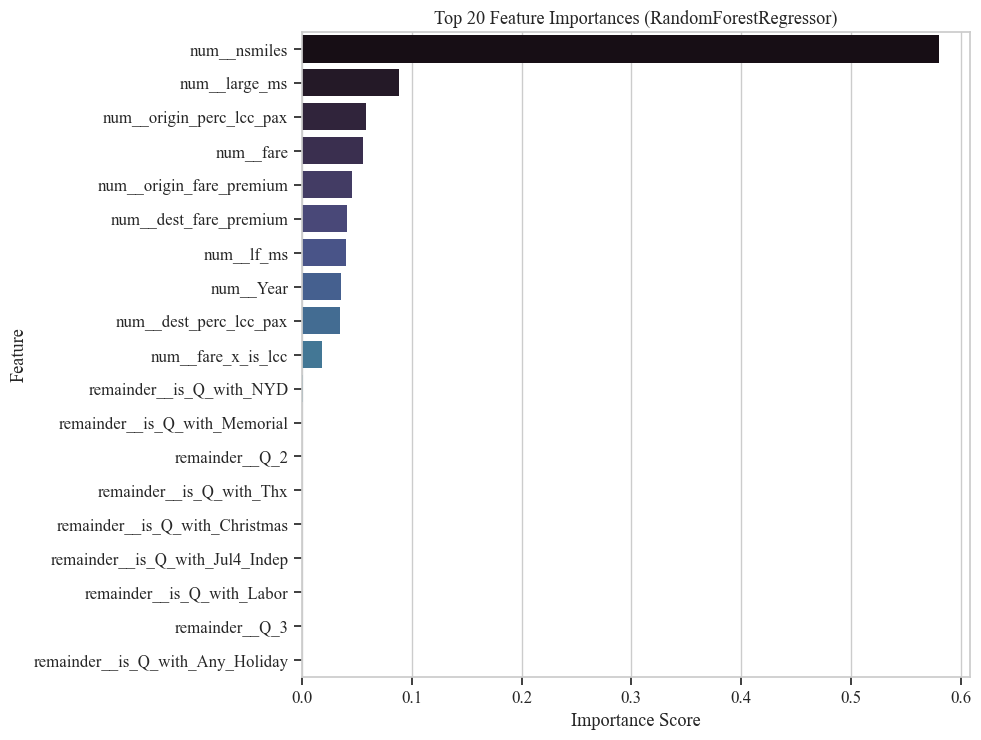

In [56]:
best_model_o = cv_o_df['RMSE'].idxmin()
print(f"\n--- Feature Importance for Best Original Scale Model: '{best_model_o}' ---")

best_pipeline_o = trained_pipelines_o[best_model_o]
input_features_o = X_train_orig.columns.tolist()

plot_feature_importance(best_pipeline_o, input_features_o)